In [1]:
%matplotlib inline

In [2]:
import scanpy as sc
import pandas as pd
import os
import matplotlib.pyplot as plt
import mplscience
from moscot.problems.time import TemporalProblem
import ast 
    
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=300)

mplscience.available_styles()
mplscience.set_style(reset_current=True)
plt.rcParams['legend.scatterpoints'] = 1 

2023-01-11 19:34:07.730249: W external/org_tensorflow/tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-11 19:34:13.334006: W external/org_tensorflow/tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-11 19:34:14.218487: W external/org_tensorflow/tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-11 19:34:32.998552: W external/org_tensorflow/tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or dire

['default', 'despine']


In [3]:
path = "/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features"

In [4]:
output_dir = "/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/plots"

In [5]:
adata = TemporalProblem.load("/lustre/groups/ml01/workspace/moscot_paper/pancreas/TemporalProblem.pkl").adata

In [6]:
adata_obs = pd.read_csv("/lustre/groups/ml01/workspace/moscot_paper/pancreas/adata_obs_cisBP_chromvar_features.h5ad")

In [7]:
adata.obs = adata_obs

In [8]:
paths = os.listdir(path)
paths = [os.path.join(path, el) for el in paths if "motif" in el]

In [9]:
paths

['/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_beta_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_delta_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_Fev_delta_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_eps_prog_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_alpha_motifs.csv',
 '/lustre/groups/ml01/workspace/moscot_paper/pancreas/driver_features/driver_eps_motifs.csv']

In [10]:
def revert_to_list(x):
    x = ast.literal_eval(x["TFs"])
    return [n.strip() for n in x]

dfs = [None] * len(paths)
for i, p in enumerate(paths):
    dfs[i] = pd.read_csv(p).set_index("Unnamed: 0")
    dfs[i]["TF"] = dfs[i].apply(revert_to_list, axis=1)
    del dfs[i]["TFs"]

# Beta

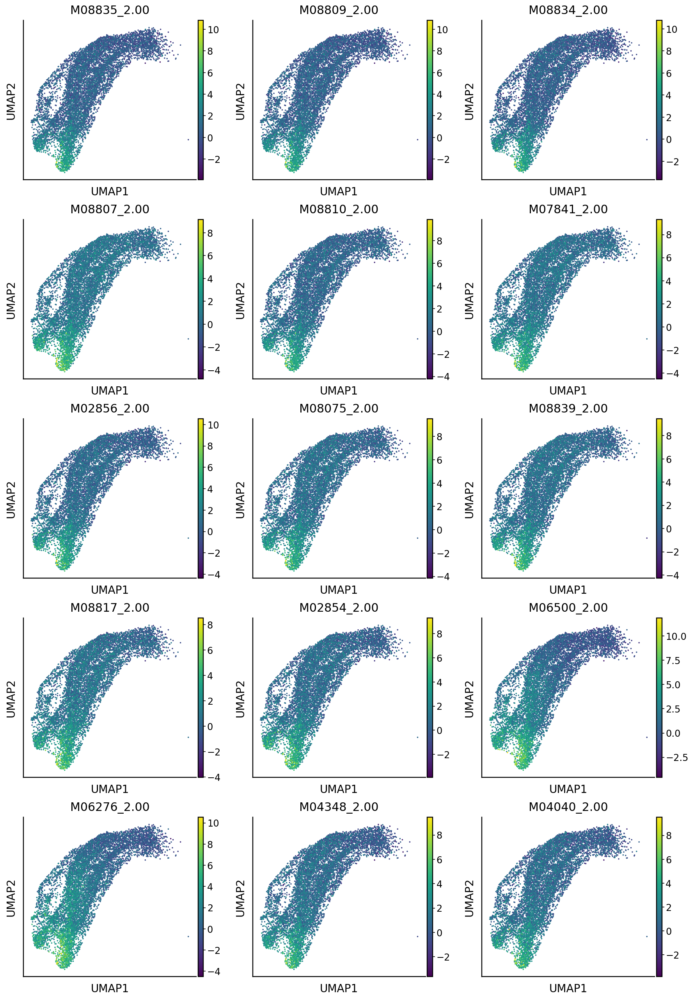

In [11]:
fig = sc.pl.umap(adata, color=dfs[0].index[:15], ncols=3, return_fig=True)

In [12]:
fig.savefig(os.path.join(output_dir, "beta_driver_motifs.png"))

In [13]:
#beta_drivers_genes = set([el for ls in dfs[0].head(n=50)["TF"].values for el in ls]).intersection(adata.var_names)

# Delta

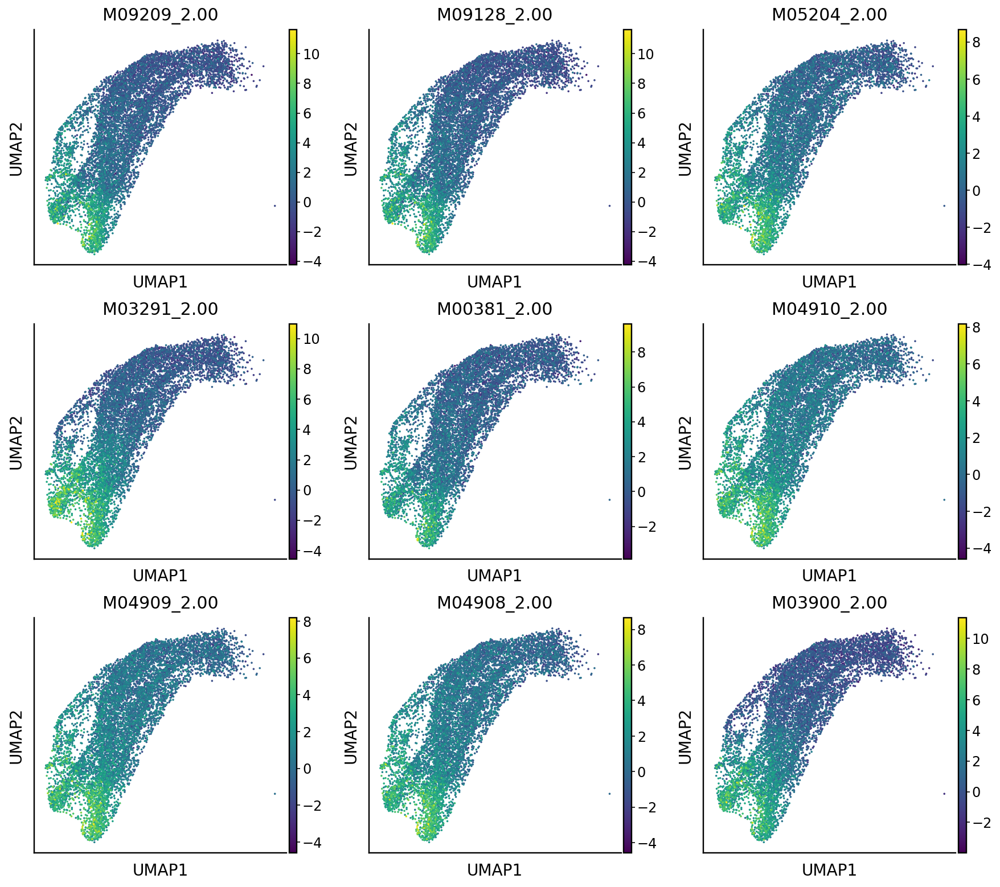

In [14]:
fig = sc.pl.umap(adata, color=dfs[1].index[:9], ncols=3, return_fig=True)

In [15]:
fig.savefig(os.path.join(output_dir, "fev_delta_driver_motifs.png"))

# Fev+ Delta

In [16]:
dfs[2].head()

,Fev_delta_pull_corr,Fev_delta_pull_pval,Fev_delta_pull_qval,Fev_delta_pull_ci_low,Fev_delta_pull_ci_high,TF_direct,TF
Unnamed: 0,,,,,,,
M09975_2.00,0.164477,1.058360e-31,6.364979e-28,0.137343,0.191364,NaN,"[Bach1, Bach2]"
M08067_2.00,0.161420,1.413194e-30,4.249475e-27,0.134260,0.188337,NaN,"[Jun, Junb, Jund]"
M07816_2.00,0.152755,1.655168e-27,3.273379e-24,0.125527,0.179754,NaN,"[Jun, Junb, Jund]"
M07827_2.00,0.152409,2.177173e-27,3.273379e-24,0.125177,0.179411,NaN,"[Fosb, Fos, Fosl1, Fosl2]"
M08073_2.00,0.151335,5.068503e-27,6.096396e-24,0.124095,0.178347,NaN,"[Jun, Junb, Jund]"


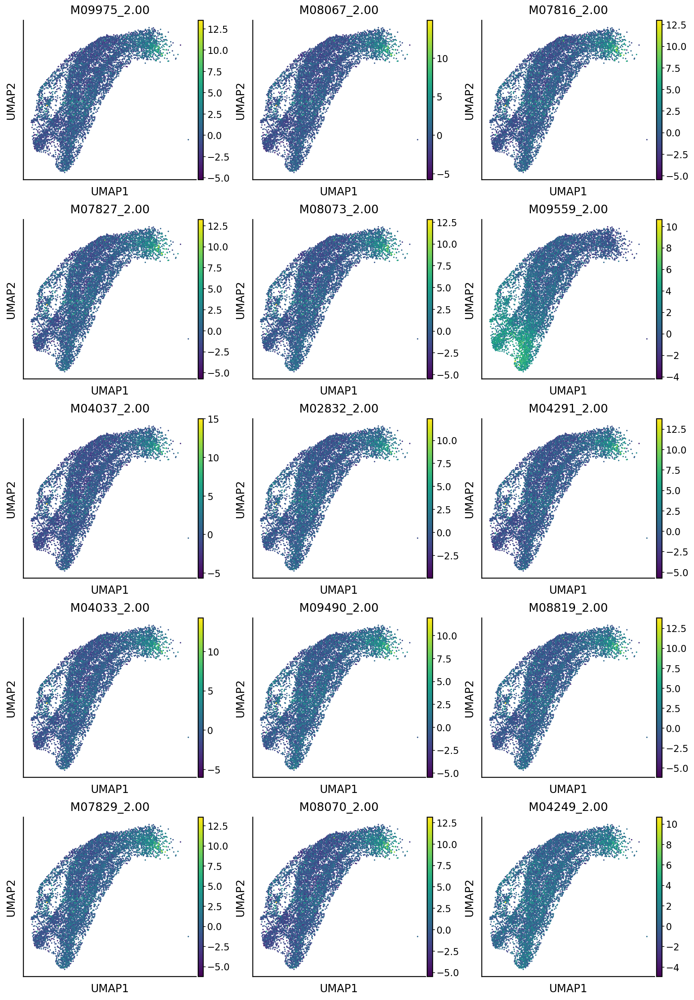

In [17]:
fig = sc.pl.umap(adata, color=dfs[2].index[:15], ncols=3, return_fig=True)

In [18]:
fig.savefig(os.path.join(output_dir, "fev_delta_driver_motifs.png"))

# Eps. prog.

In [19]:
dfs[3].head()

,Eps_prog_pull_corr,Eps_prog_pull_pval,Eps_prog_pull_qval,Eps_prog_pull_ci_low,Eps_prog_pull_ci_high,TF_direct,TF
Unnamed: 0,,,,,,,
M03479_2.00,0.100682,9.992973e-13,1.717078e-10,0.073125,0.128085,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M03480_2.00,0.100017,1.408427e-12,2.352855e-10,0.072457,0.127424,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M03478_2.00,0.098992,2.380981e-12,3.768216e-10,0.071427,0.126405,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M03475_2.00,0.098481,3.087159e-12,4.760557e-10,0.070914,0.125898,NaN,"[Nfix, Nfib, Nfia, Nfic]"
M05747_2.00,0.096162,9.862349e-12,1.446638e-09,0.068585,0.123593,NaN,"[Nfix, Nfib, Nfia, Nfic]"


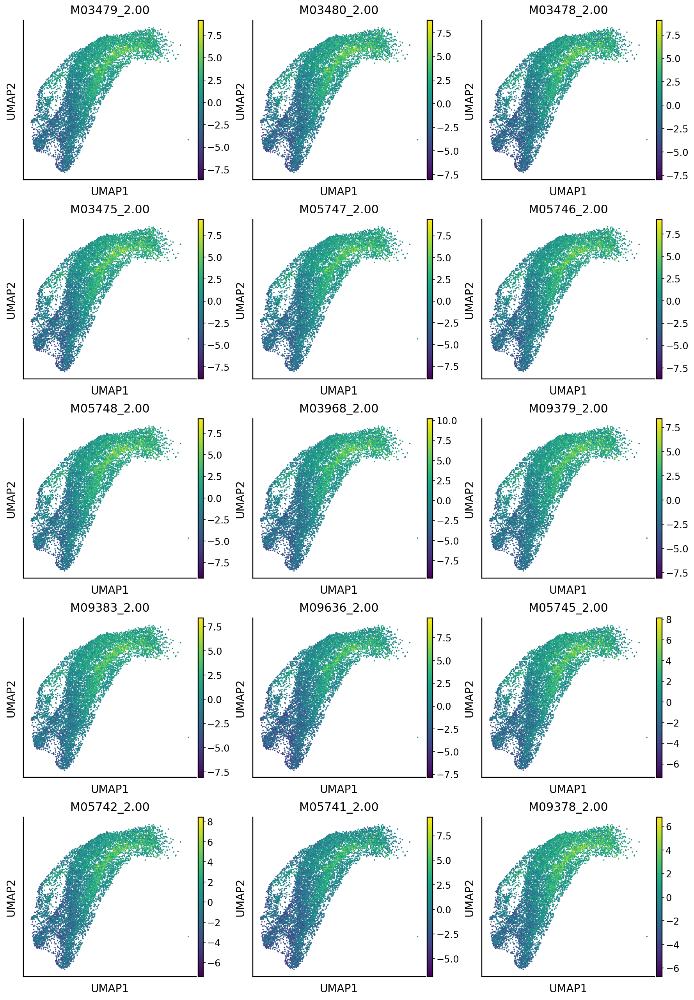

In [20]:
fig = sc.pl.umap(adata, color=dfs[3].index[:15], ncols=3, return_fig=True)

In [21]:
fig.savefig(os.path.join(output_dir, "eps_prog_driver_motifs.png"))

# Alpha

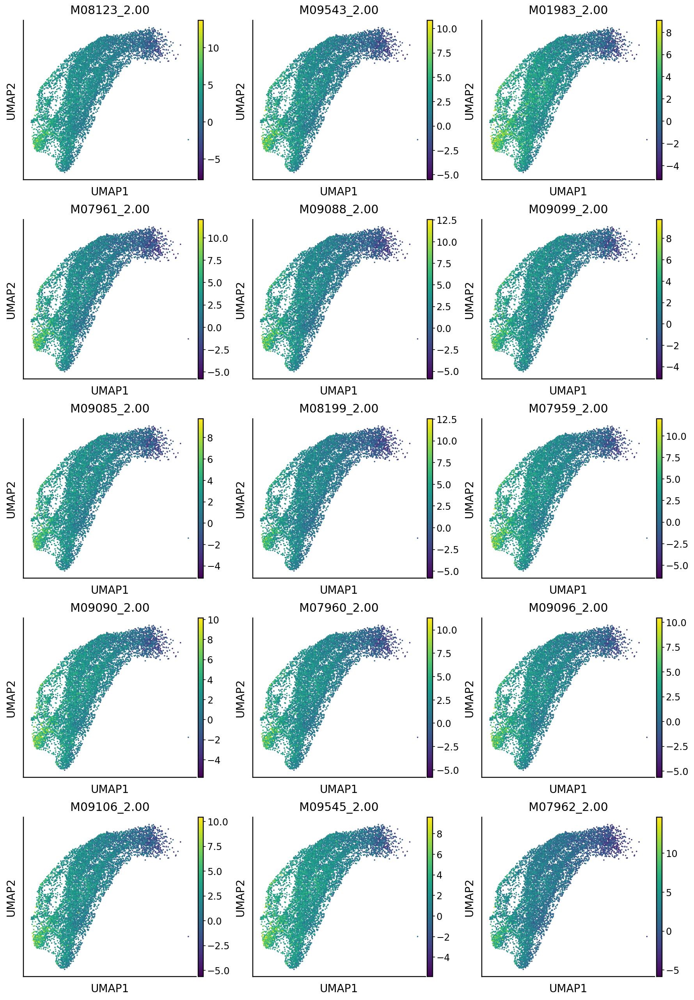

In [22]:
fig = sc.pl.umap(adata, color=dfs[4].index[:15], ncols=3, return_fig=True)

In [23]:
fig.savefig(os.path.join(output_dir, "alpha_driver_motifs.png"))

# Epsilon

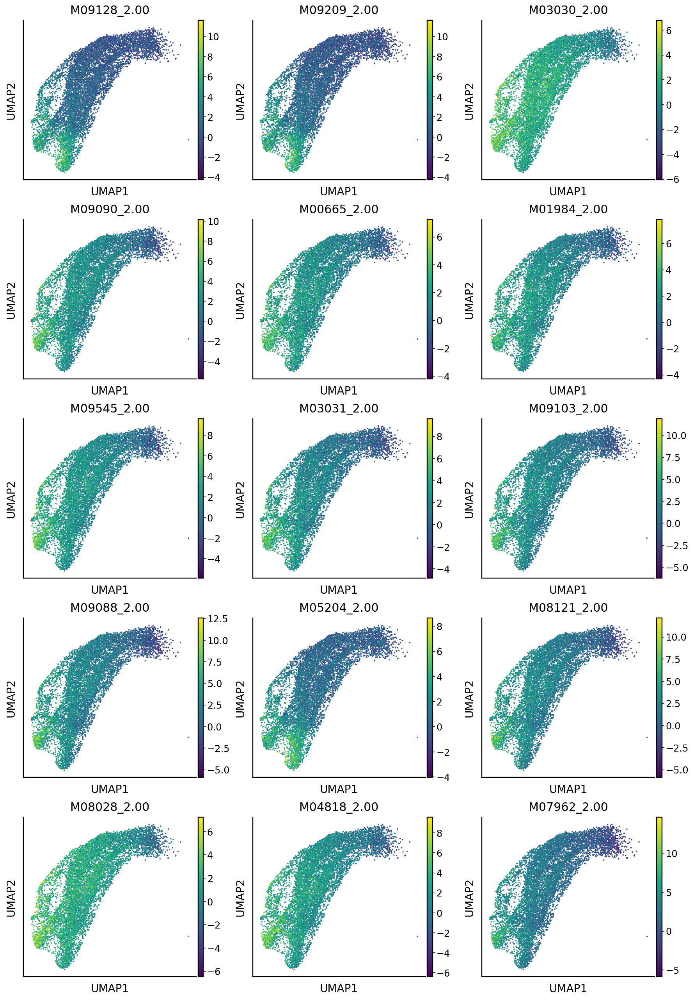

In [24]:
fig = sc.pl.umap(adata, color=dfs[5].index[:15], ncols=3, return_fig=True)

In [25]:
fig.savefig(os.path.join(output_dir, "eps_driver_motifs.png"))